# Imports, environment initialization, and agent file names

In [2]:
from collections import namedtuple
from kaggle_environments import make
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import pickle
import seaborn as sns
from scipy import stats
from tqdm import tqdm
%matplotlib inline

env = make('mab', debug=True)

RANDOM = 'agents/random_agent.py'
ALWAYS_FIRST = 'agents/always_first_agent.py'
SAMPLE_UCB = 'agents/sample_ucb_agent.py'
UCB_DECAY = 'ucb_decay.py'
BASIC_BAYESIAN_UCB = 'agents/basic_bayesian_ucb.py'
BAYESIAN_UCB_WITH_ACTION_HISTORY = 'agents/bayesian_ucb_with_action_history.py'
BASIC_THOMPSON_SAMPLING = 'agents/basic_thompson_sampling.py'
THOMPSON_SAMPLING_WITH_ACTION_HISTORY = 'agents/thompson_sampling_with_action_history.py'
GREEDY_THOMPSON_SAMPLING_WITH_ACTION_HISTORY = 'agents/greedy_thompson_sampling_with_action_history.py'
DISCRETE_THOMPSON_SAMPLING = 'agents/discrete_thompson_sampling.py'
DISCRETE_THOMPSON_SAMPLING_WITH_ACTION_HISTORY = 'agents/discrete_thompson_sampling_with_action_history.py'
THOMPSON_SAMPLING_WITH_OPPONENT_SIMULATION = 'agents/thompson_sampling_with_opponent_simulation.py'

Loading environment football failed: No module named 'gfootball'


# Custom comparison functions

In [3]:
class SimViz:
    
    def __init__(self, sims=None):
        
        # Copy simulations to object
        if sims:
            self.sims = {name:env for name,env in sims.items()}
            # Get simulation environments (JSON)
            self.envs = {k:self.get_env_json(env) for k,env in self.sims.items()}
        else:
            self.sims = {}
            self.envs = {}
            
    def get_env_json(self, env):
        try:
            env_json = env.toJSON()
            return env_json
        except:
            print('ERROR: Invalid environment')
            
    def add_env(self, env, name=None):
        # TODO: Make sure it is a unique name
        if name is None:
            name =  f'{len(self.envs) + 1}'
            name += f'_{"".join(k[-1] for k in self.envs.keys())}'
        # Add to both sims and envs
        self.sims[name] = env
        self.envs[name] = self.get_env_json(env)
        
    def add_sim(self, env, name=None):
        # TODO: Make sure it is a unique name
        if name is None:
            name =  f'{len(self.sims) + 1}'
            name += f'_{"".join(k[-1] for k in self.sims.keys())}'
        # Add to both sim and env
        self.sims[name] = env
        self.add_env(env, name)
            

    def get_rewards(self, name):
        # TODO:  Check for error
        agent_steps = self.envs.get(name).get('steps')
        n_steps = len(agent_steps)
        rewards0 = [agent_steps[s][0].get('reward') for s in range(n_steps)]
        rewards1 = [agent_steps[s][1].get('reward') for s in range(n_steps)]
        return rewards0, rewards1
    
    def plot_total_reward(self, names=None, *args, **kwargs):
        fig,ax = plt.subplots()
        fig.suptitle('Total Rewards Over Steps')
        ax.set_xlabel('Steps')
        ax.set_ylabel('Rewards (cummulative)')
        if names is None:
            names = list(self.envs.keys())
        elif not isinstance(names, list):
            names = [names]
        
        # Plot all the simulations given
        for name in names:
            rewards0, rewards1 = self.get_rewards(name)
            ax.plot(rewards0, label='agent_0', *args, **kwargs)
            ax.plot(rewards1, label='agent_1', *args, **kwargs)
            ax.plot(np.abs(np.array(rewards1) - np.array(rewards0)), label='reward_delta', *args, **kwargs)
        ax.legend()

        return fig, ax

# Thompson sampling with opponent simulation

In [5]:
%%writefile $THOMPSON_SAMPLING_WITH_OPPONENT_SIMULATION

import numpy as np
from scipy import stats

post_a = None
post_b = None
bandit = None
total_reward = 0

class Agent():
    def __init__(self, configuration, n_mc_sims=500, mc_noising_rate=0.8, min_mc_kept=10):
        self.n_bandits = configuration.banditCount
        self.decay_rate = configuration.decayRate
        self.total_reward = 0
        self.last_act = None
        
        self.n_mc_sims = n_mc_sims
        self.mc_noising_rate = mc_noising_rate
        self.min_mc_kept = min_mc_kept
        
        self.post_a = np.ones(self.n_bandits)
        self.post_b = np.ones(self.n_bandits)
        self.est_opp_post_a = np.ones(self.n_bandits)
        self.est_opp_post_b = np.ones(self.n_bandits)
        self.opp_actions = np.zeros(self.n_bandits)
        self.amount_decayed = np.ones(self.n_bandits, dtype=np.float)
    
    def simulate_opp_posteriors(self, observation):
        opp_last_act = observation.lastActions[not observation.agentIndex]
        # TODO: This simulates a and b from scratch each round - maybe there is a better way that uses the estimations across rounds?
        # self.opp_actions + 1, because np.random.randint requires a minimum value of 1 (and always returns 0 in that case anyways)
        #mc_successes = np.concatenate([np.random.randint(n, size=(1, self.n_mc_sims, 1)) for n in self.opp_actions + 1], axis=0)
        mc_a_kept = np.empty((self.n_bandits, 0))
        mc_b_kept = np.empty((self.n_bandits, 0))
        
        for i in range(5):
            """
            mc_successes = stats.binom.rvs(
                self.opp_actions.astype(np.int)[:,np.newaxis,np.newaxis],
                (self.est_opp_post_a / (self.est_opp_post_a + self.est_opp_post_b))[:,np.newaxis,np.newaxis],
                size=(self.n_bandits, self.n_mc_sims, 1)
            )"""
            #mc_successes = stats.randint.rvs(0, self.opp_actions.astype(np.int)[:,np.newaxis,np.newaxis] + 1, size=(self.n_bandits, self.n_mc_sims, 1))
            mc_successes = stats.betabinom.rvs(
                self.opp_actions.astype(np.int)[:,np.newaxis],
                np.maximum(self.est_opp_post_a[:,np.newaxis] * (self.mc_noising_rate ** i), 1),
                np.maximum(self.est_opp_post_b[:,np.newaxis] * (self.mc_noising_rate ** i), 1),
                size=(self.n_bandits, self.n_mc_sims)
            )
            mc_failures = self.opp_actions[:, np.newaxis] - mc_successes
            # a/b = successes/failures + 1, because a and b start at 1 for a uniform prior
            mc_a = mc_successes + 1
            mc_b = mc_failures + 1

            mc_thompson_samples = np.random.beta(mc_a, mc_b, size=(self.n_bandits, self.n_mc_sims))# * self.amount_decayed[:, np.newaxis]
            mc_acts = np.argmax(mc_thompson_samples, axis=0)
            correct_acts_mask = mc_acts == opp_last_act
            mc_a_kept = np.concatenate([mc_a_kept, mc_a[:, correct_acts_mask]], axis=1)
            mc_b_kept = np.concatenate([mc_b_kept, mc_b[:, correct_acts_mask]], axis=1)
            if mc_a_kept.shape[1] >= self.min_mc_kept:
                break
                
        if mc_a_kept.shape[1] >= self.min_mc_kept:
            self.est_opp_post_a = np.mean(mc_a_kept.squeeze(), axis=-1)
            self.est_opp_post_b = np.mean(mc_b_kept.squeeze(), axis=-1)
                
            # TODO: Does this second iteration of monte-carlo help stabilize results?
            #mc_thompson_samples = np.random.beta(mc_a, mc_b, size=(self.n_bandits, correct_acts_mask.sum(), 100))# * self.amount_decayed[:, np.newaxis, np.newaxis]
            #mc_weights = np.sum(np.argmax(mc_thompson_samples, axis=0) == opp_last_act, axis=-1)
            #assert False
            #self.est_opp_post_a = np.average(mc_a.squeeze(), axis=-1, weights=mc_weights.squeeze())
            #self.est_opp_post_b = np.average(mc_b.squeeze(), axis=-1, weights=mc_weights.squeeze())
        
    def get_action(self, observation):
        if observation.step > 0:
            r = observation.reward - self.total_reward
            self.total_reward = observation.reward

            # Update agent's beta posterior
            self.post_a[self.last_act] += r
            self.post_b[self.last_act] += (1 - r)
            
            # Estimate opponent's posteriors before they selected a bandit
            self.simulate_opp_posteriors(observation)
            
            # Update opp_actions and n_pulls after estimating opponent's posteriors, but before selecting an action for this round
            opp_last_act = observation.lastActions[not observation.agentIndex]
            self.opp_actions[opp_last_act] += 1
            for action in observation.lastActions:
                self.amount_decayed[action] *= self.decay_rate
        
        if observation.step > 2:
            samples = np.random.beta(self.post_a + self.est_opp_post_a - 1, self.post_b + self.est_opp_post_b - 1) * self.amount_decayed
        else:
            samples = np.random.beta(self.post_a, self.post_b)
        self.last_act = int(np.argmax(samples))
        return self.last_act

curr_agent = None
def agent(observation, configuration):
    global curr_agent
    
    if curr_agent is None:
        curr_agent = Agent(configuration)
    
    return curr_agent.get_action(observation)

Overwriting agents/thompson_sampling_with_opponent_simulation.py


# Simulations

## Run locally step-by-step:

In [9]:
from agents import basic_thompson_sampling, thompson_sampling_with_opponent_simulation, random_agent, pull_vegas_slot_machines
Configuration = namedtuple('Configuration', env.__dict__['configuration'].keys())
Observation = namedtuple('Observation', ['agentIndex', 'lastActions', 'step', 'reward'])

env.reset();
last_actions = None
config = Configuration(**env.__dict__['configuration'])

base_agent = basic_thompson_sampling
base_agent.post_a = None
base_agent.post_b = None
base_agent.bandit = None
base_agent.total_reward = 0
#opp_sim_agent = thompson_sampling_with_opponent_simulation
#opp_sim_agent.curr_agent = None
pull_vegas_agent = pull_vegas_slot_machines
pull_vegas_agent.bandit_dict = {}
agents = [base_agent.agent, pull_vegas_agent.agent]

In [10]:
best_thresholds = []
selected_thresholds = []
for step in tqdm(range(1999)):
    observations = [Observation(
        agentIndex=i,
        lastActions=env.state[0]['observation']['lastActions'],
        step=env.state[0]['observation']['step'],
        reward=env.state[i]['reward']
    ) for i in range(2)]
    actions = [agents[i](observations[i], config) for i in range(2)]
    best_thresholds.append(np.max(env.state[0]['observation']['thresholds']))
    selected_thresholds.append([env.state[0]['observation']['thresholds'][act] for act in actions])
    env.step(actions)
best_thresholds = np.array(best_thresholds) / 100.
selected_thresholds = np.array(selected_thresholds) / 100.
observations

100%|██████████| 1999/1999 [00:01<00:00, 1335.39it/s]


[Observation(agentIndex=0, lastActions=[14, 14], step=1998, reward=577),
 Observation(agentIndex=1, lastActions=[14, 14], step=1998, reward=646)]

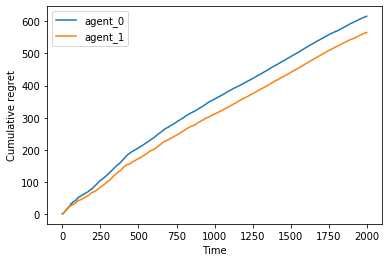

In [11]:
agent_0_regret = best_thresholds - selected_thresholds[:,0]
agent_1_regret = best_thresholds - selected_thresholds[:,1]

plt.plot(np.cumsum(agent_0_regret), label='agent_0')
plt.plot(np.cumsum(agent_1_regret), label='agent_1')
plt.xlabel('Time')
plt.ylabel('Cumulative regret')
plt.legend();

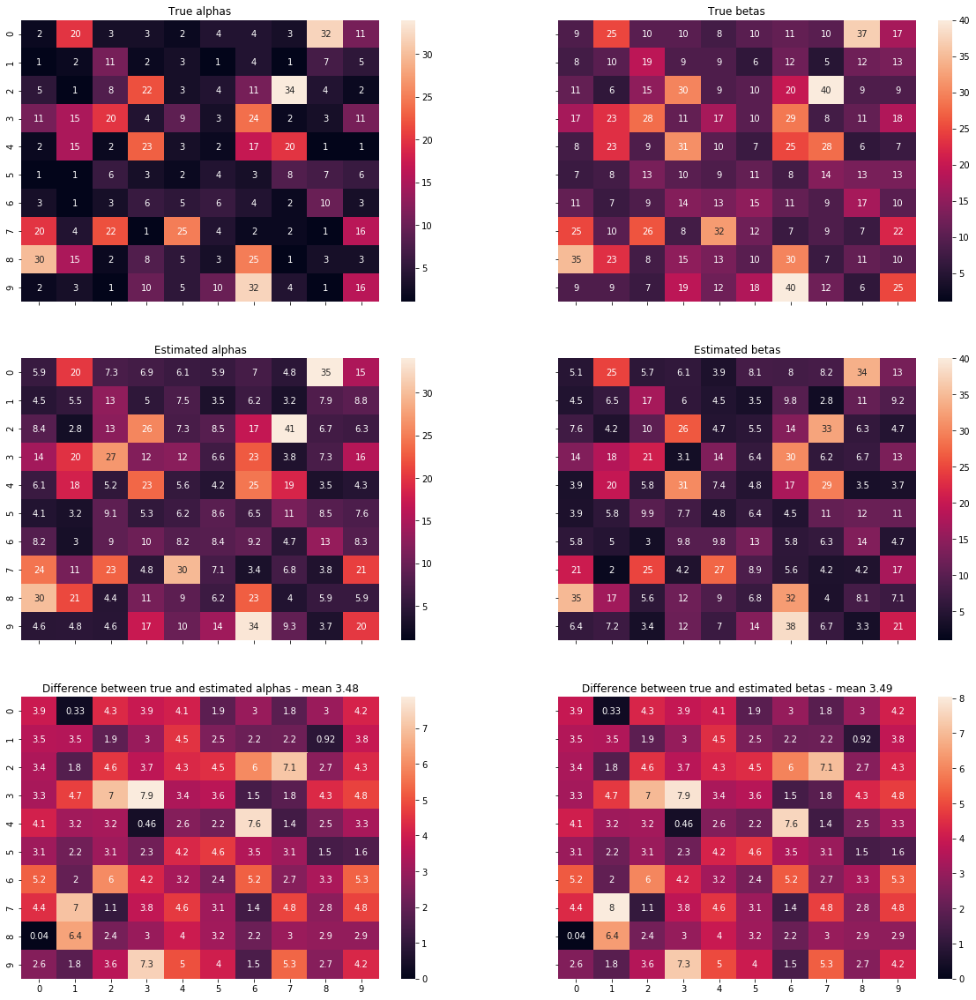

In [7]:
fig, axes = plt.subplots(
    3, 2,
    sharex=True, sharey=True,
    figsize=(20,20)
)

# Draw alpha heatmaps
axes[0,0].set_title('True alphas')
sns.heatmap(base_agent.post_a.reshape((10,10)), ax=axes[0,0],
            vmin=1, vmax=np.max(base_agent.post_a), annot=True)
axes[1,0].set_title('Estimated alphas')
sns.heatmap(opp_sim_agent.curr_agent.est_opp_post_a.reshape((10,10)), ax=axes[1,0],
            vmin=1, vmax=np.max(base_agent.post_a), annot=True)
axes[2,0].set_title('Difference between true and estimated alphas - mean {:.2f}'.format(
    np.abs(base_agent.post_a - opp_sim_agent.curr_agent.est_opp_post_a).mean()
))
sns.heatmap(np.abs(np.around(base_agent.post_a - opp_sim_agent.curr_agent.est_opp_post_a, 2)).reshape((10,10)), ax=axes[2,0],
            vmin=0, annot=True)

# Draw beta heatmaps
axes[0,1].set_title('True betas')
sns.heatmap(base_agent.post_b.reshape((10,10)), ax=axes[0,1],
            vmin=1, vmax=np.max(base_agent.post_b), annot=True)
axes[1,1].set_title('Estimated betas')
sns.heatmap(opp_sim_agent.curr_agent.est_opp_post_b.reshape((10,10)), ax=axes[1,1],
            vmin=1, vmax=np.max(base_agent.post_b), annot=True)
axes[2,1].set_title('Difference between true and estimated betas - mean {:.2f}'.format(
    np.abs(base_agent.post_b - opp_sim_agent.curr_agent.est_opp_post_b).mean()
))
sns.heatmap(np.abs(np.around(base_agent.post_b - opp_sim_agent.curr_agent.est_opp_post_b, 2)).reshape((10,10)), ax=axes[2,1],
            vmin=0, annot=True)

None

In [9]:
env.reset()
env.run([BASIC_THOMPSON_SAMPLING, THOMPSON_SAMPLING_WITH_OPPONENT_SIMULATION])
#env.run([RANDOM, DISCRETE_THOMPSON_SAMPLING_WITH_ACTION_HISTORY])
env.render(mode='ipython', width=800, height=500)

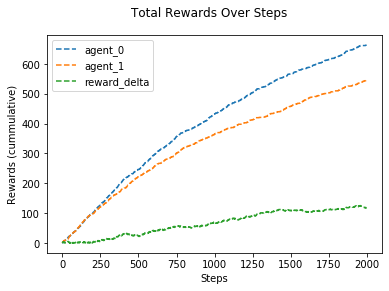

In [8]:
test = SimViz(dict(env=env))
f, ax = test.plot_total_reward(linestyle='dashed')

# Misc

Agent observation structure, as of 12/11/20: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 0, 'step': 0, 'lastActions': [5, 7]}

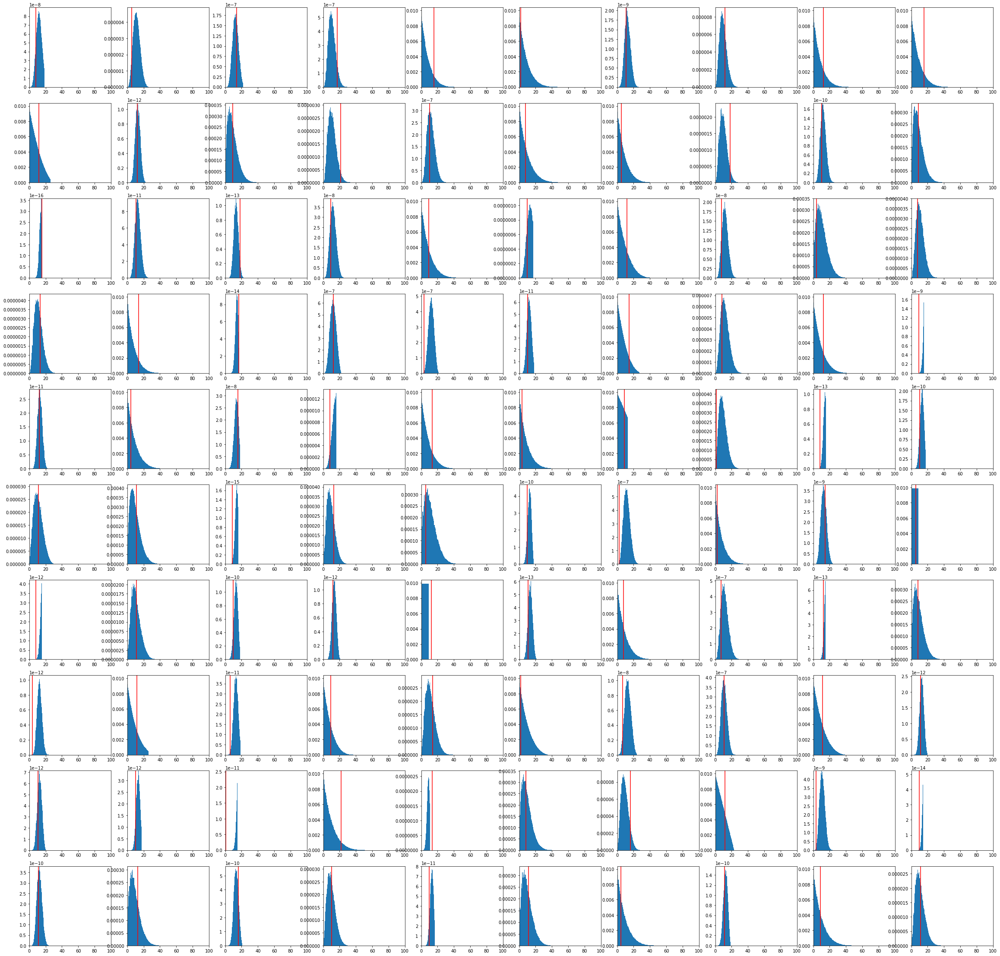

In [250]:
with open('log.pkl', 'rb') as f:
    posteriors_list, thresholds_list = pickle.load(f)

fig, axes = plt.subplots(10, 10, figsize=(40,40))

final_posteriors = posteriors_list[-1]
final_thresholds = thresholds_list[-1]
for i in range(100):
    ax = axes[i // 10, i % 10]
    posterior = final_posteriors[i]
    thresholds = final_thresholds[i]
    ax.bar(thresholds, posterior, width=max(thresholds) / 100)
    ax.axvline(env.__dict__['state'][0]['observation']['thresholds'][i], color='r')
    ax.set_xlim(0,100)

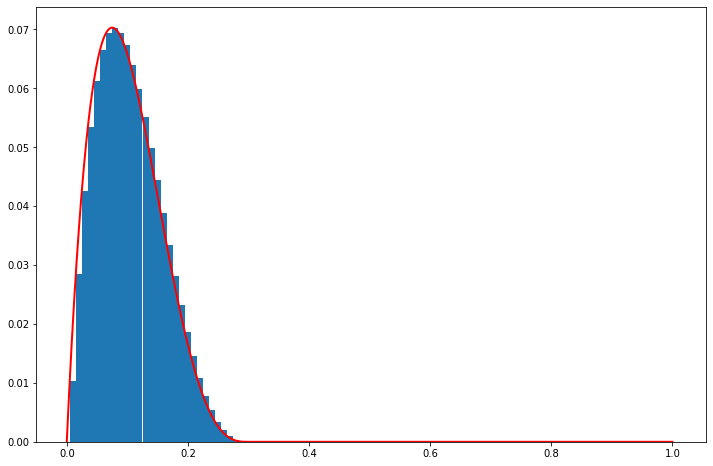

In [21]:
#sample_res = env.configuration.sampleResolution
sample_res = 100
beta_kwargs = dict(
    a=np.array([1,1,1,2]).reshape((-1,1)),
    b=np.array([1,2,3,4]).reshape((-1,1)),
    scale=np.array([0.2, 0.2, 0.3, 0.3]).reshape((-1,1))
)
discretized_posteriors = beta.cdf((np.arange(sample_res) + 1) / sample_res, **beta_kwargs) - beta.cdf(np.arange(sample_res) / sample_res, **beta_kwargs)
#np.random.choice(np.arange())
discretized_posteriors
# See threshold distributions
fig, ax = plt.subplots(1,1, figsize=(12,8))
target_idx = 3
bar_target = discretized_posteriors[target_idx]
ax.bar((np.arange(len(bar_target)) + 1.) / sample_res, bar_target, width=1 / (sample_res+1));
ax.plot(np.linspace(0,1,1000), beta.pdf(np.linspace(0,1,1000), **beta_kwargs)[target_idx] / sample_res, color='r', linewidth=2);

In [303]:
# This is not quite precise - there is too much uncertainty in the posterior about the potential upper limits of the post-decay reward likelihood
def update_prior_v1(a, b, decay=0.5):
    n_samples = a + b
    expectation = decay * a / (a + b)
    new_a = n_samples * expectation
    new_b = n_samples - n_samples * expectation
    return new_a, new_b

def update_prior_v2(a, b, decay=0.5):
    n_samples = a + b
    expectation = decay * a / (a + b)
    new_a = n_samples * expectation
    new_b = n_samples - n_samples * expectation
    return new_a, new_b

a: 1.6199999999999997, b: 1.3800000000000003
Standard deviation-based estimated upper bound:	 1.038
Beta ppf at 0.98:				 0.962


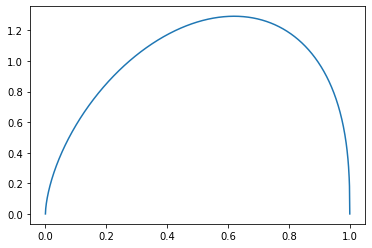

In [311]:
a, b = update_prior_v1(2, 1, decay=0.9)
a, b = update_prior_v1(a, b, decay=0.9)
#a = 1
#b = 1
print(f'a: {a}, b: {b}')
print(f'Standard deviation-based estimated upper bound:\t {beta.stats(a, b, moments="m") + beta.std(a, b) * 2:.3f}')
ppf_val = 0.98.astype(np.float64)
print(f'Beta ppf at {ppf_val}:\t\t\t\t {beta.ppf(ppf_val, a, b):.3f}')

#x = np.linspace(beta.ppf(0.01, a, b), beta.ppf(0.99, a, b), 1000)
x = np.linspace(0, 1, 1000)
#fig, ax = plt.subplots(1, 1, figsize=(10,10))
plt.plot(x, beta.pdf(x, a, b));

In [104]:
env.reset()
min(env.__dict__['state'][0]['observation']['thresholds']), max(env.__dict__['state'][0]['observation']['thresholds'])

(0, 100)

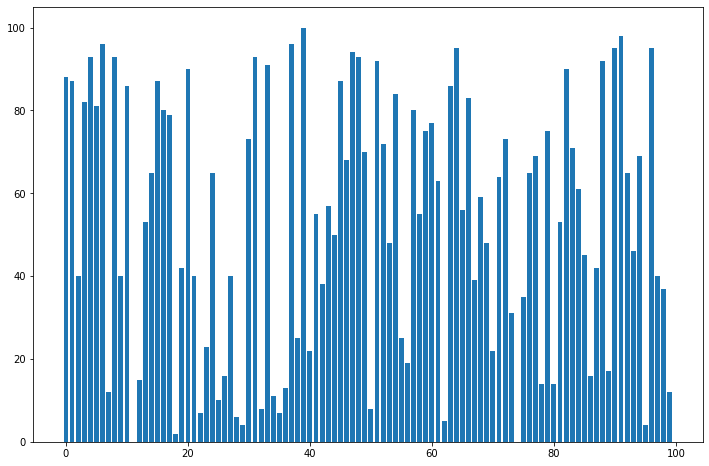

In [105]:
# See threshold distributions
fig, ax = plt.subplots(1,1, figsize=(12,8))
ax.bar(np.arange(env.configuration['banditCount']), env.__dict__['state'][0]['observation']['thresholds']);